In [12]:
%load_ext tensorboard
import pandas as pd
import matplotlib.pyplot as plt
from pandarallel import pandarallel
import seaborn as  sns
import numpy as np

pandarallel.initialize(progress_bar=True)

data = pd.read_csv('fake reviews dataset.csv')
data.head()


The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard
INFO: Pandarallel will run on 6 workers.
INFO: Pandarallel will use standard multiprocessing data transfer (pipe) to transfer data between the main process and workers.

https://nalepae.github.io/pandarallel/troubleshooting/


,category,rating,label,text_
0,Home_and_Kitchen_5,5.0,CG,"Love this! Well made, sturdy, and very comfor..."
1,Home_and_Kitchen_5,5.0,CG,"love it, a great upgrade from the original. I..."
2,Home_and_Kitchen_5,5.0,CG,This pillow saved my back. I love the look and...
3,Home_and_Kitchen_5,1.0,CG,"Missing information on how to use it, but it i..."
4,Home_and_Kitchen_5,5.0,CG,Very nice set. Good quality. We have had the s...


In [13]:
data.describe()

,rating
count,40432.000000
mean,4.256579
std,1.144354
min,1.000000
25%,4.000000
50%,5.000000
75%,5.000000
max,5.000000


## Tokenized the text

`pandarallel` is a python library for parallelizing your pandas operations. It provides function such as `parallel_apply` to run `apply` in parallel.

In [14]:
from nltk.probability import FreqDist
from nltk.tokenize import word_tokenize
data['tokenized_text'] = data['text_'].parallel_apply(word_tokenize)

LookupError: 
**********************************************************************
  Resource [93mpunkt[0m not found.
  Please use the NLTK Downloader to obtain the resource:

  [31m>>> import nltk
  >>> nltk.download('punkt')
  [0m
  For more information see: https://www.nltk.org/data.html

  Attempted to load [93mtokenizers/punkt/english.pickle[0m

  Searched in:
    - 'C:\\Users\\black/nltk_data'
    - 'C:\\Program Files\\Python311\\nltk_data'
    - 'C:\\Program Files\\Python311\\share\\nltk_data'
    - 'C:\\Program Files\\Python311\\lib\\nltk_data'
    - 'C:\\Users\\black\\AppData\\Roaming\\nltk_data'
    - 'C:\\nltk_data'
    - 'D:\\nltk_data'
    - 'E:\\nltk_data'
    - ''
**********************************************************************


In [ ]:
data['text_length'] = data['tokenized_text'].apply(lambda x: len(x))
data.head()

## Analysis of data

We can see that the most review length are around 24 to 96 length.

In [16]:
# Plot histogram
plt.figure(figsize=(10, 6))
plt.hist(data['text_length'].to_list(), bins=20, color='skyblue', edgecolor='black')
plt.title('Histogram of Text Lengths')
plt.xlabel('Length of Text')
plt.ylabel('Frequency')
plt.grid(axis='y', alpha=0.75)

# Display the histogram
plt.show()

KeyError: 'text_length'

<Figure size 1000x600 with 0 Axes>

In [17]:
plt.figure(figsize=(15, 6))
ax = sns.violinplot(data, x='text_length', y='label', palette='turbo', inner=None, linewidth=0, saturation=0.4, hue="label")
plt.title('Violin Plot of Text Length')
plt.xlabel('Text Length')
sns.boxplot(data, x='text_length', y='label', palette='turbo', width=0.1,
            boxprops={'zorder': 2}, ax=ax, hue="label")
plt.show()

ValueError: Could not interpret value `text_length` for `x`. An entry with this name does not appear in `data`.

<Figure size 1500x600 with 0 Axes>

In [18]:
q1 = np.percentile(data['text_length'], 25)
q3 = np.percentile(data['text_length'], 75)
print("50% of the review length is between {:0.0f}-{:0.0f}".format(q1, q3))

KeyError: 'text_length'

## Most common words used
Before preprocessing

In [19]:
import pandas as pd
import nltk
from nltk.probability import FreqDist
from itertools import chain

def flatten_words(data):
    return list(chain.from_iterable(data))

def find_common_words_with_freqdist(data):
    # Flatten all words from all columns into a single list
    all_words = flatten_words(data)
    
    # Create a frequency distribution
    freq_dist = FreqDist(all_words)
    return freq_dist

# Find and print the common words
common_words = find_common_words_with_freqdist(data['tokenized_text'])

# Separating the words and their frequencies for plotting
words, frequencies = zip(*common_words.most_common(20))

# Creating the bar graph
plt.figure(figsize=(10, 6))
plt.bar(words, frequencies, color='skyblue')
plt.xlabel('Words')
plt.ylabel('Frequency')
plt.title('Top 20 Common Words')
plt.xticks(rotation=45)  # Rotate the word labels for better readability
plt.show()

KeyError: 'tokenized_text'

In [20]:
from wordcloud import WordCloud

def display_wordcloud(frequency_distribution):
    wordcloud = WordCloud(width = 800, height = 400, background_color ='white').generate_from_frequencies(frequency_distribution)

    # Display the generated image:
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis("off")
    plt.show()


display_wordcloud(dict(common_words.most_common(100)))

NameError: name 'common_words' is not defined

## Preprocessing

### Remove Stopwords, Remove punctuation, Convert text to lowercase, Stemming

What is Stemming?
Adapted from https://botpenguin.com/glossary/stemming

![stemming](Stemming.png "Stemming")

In [ ]:

# nlp preprocessing, stop word remover,
import nltk
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer
from nltk.tokenize import word_tokenize
import string

# nltk.download('punkt')
nltk.download('stopwords')
english_stopwords = set(stopwords.words('english'))
porter = PorterStemmer()

def preprocess_tokenized_text(tokenized_list):
    # Remove punctuation and convert to lowercase
    stripped_tokens = [word.lower().translate(str.maketrans('', '', string.punctuation)) for word in tokenized_list]
    # Apply stemming to each token
    stemmed_tokens = [porter.stem(word) for word in stripped_tokens]
    # Remove stopwords and any empty strings left from stripping punctuation
    return [word for word in stemmed_tokens if word and word not in english_stopwords]

data['tokenized_text_without_stopwords'] = data['tokenized_text'].parallel_apply(preprocess_tokenized_text)
data['text_without_stopwords'] = data['tokenized_text_without_stopwords'].parallel_apply(' '.join)

data.head()

## Most commonly used words after preprocessing

In [ ]:
# Find and print the common words
common_words = find_common_words_with_freqdist(data['tokenized_text_without_stopwords'])

# Separating the words and their frequencies for plotting
words, frequencies = zip(*common_words.most_common(20))

# Creating the bar graph
plt.figure(figsize=(10, 6))
plt.bar(words, frequencies, color='skyblue')
plt.xlabel('Words')
plt.ylabel('Frequency')
plt.title('Top 20 Common Words')
plt.xticks(rotation=45)  # Rotate the word labels for better readability
plt.show()

In [ ]:
display_wordcloud(dict(common_words.most_common(100)))

# DNN Model

# Using Word2Vec to transform text into vectors

Text will be transform into a fixed-size vector with a dimension of 100

In [ ]:
import gensim
import scipy

vector_dim = 100

model_w2v = gensim.models.Word2Vec(sentences=data['tokenized_text_without_stopwords'], vector_size=vector_dim, window=5, workers=4, min_count=1)

def vectorize_text(text, model_w2v):
    word_vectors = [model_w2v.wv[word] for word in text if word in model_w2v.wv]
    if len(word_vectors) == 0:
        return np.zeros(model_w2v.vector_size)
    else:
        return np.mean(word_vectors, axis=0)
        
data['vectorized_text_without_stopwords'] = data['tokenized_text_without_stopwords'].parallel_apply(lambda x: vectorize_text(x, model_w2v))
data[['tokenized_text_without_stopwords','vectorized_text_without_stopwords']].head()

## Convert Category to one-hot encoding

In [ ]:
category = pd.get_dummies(data['category']).astype(np.int8)
rating = pd.get_dummies(data['rating']).astype(np.int8)

In [ ]:
from sklearn.model_selection import train_test_split

# Prepare data for the neural network
pd.set_option('future.no_silent_downcasting', True)

vectorised_text = np.array(data['vectorized_text_without_stopwords'].tolist())
onehot_encoded_category = category.to_numpy()
onehot_encoded_rating = rating.to_numpy()

X = np.concatenate([onehot_encoded_category, onehot_encoded_rating, vectorised_text], axis=1)
# CG (Fake) - 1
# OR (Real) - 0
y = data['label'].replace('CG', 1).replace('OR', 0).astype('int32').values

# Split the data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

print('Training Data: ' + str(X_train))
print('Training Label: ' + str(y_train))

## Training the DNN Model

In [ ]:
from tensorflow.keras import layers, models
import tensorflow as tf

# Define the neural network architecture
model = models.Sequential()
model.add(layers.Dense(1024, activation='relu', input_shape=(115,)))
model.add(layers.Dense(512, activation='relu'))
model.add(layers.Dense(128, activation='relu'))
model.add(layers.Dense(64, activation='relu'))
model.add(layers.Dense(1, activation='sigmoid'))

model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir="logs")

# Train the model
model.fit(X_train, y_train, epochs=10, batch_size=32, validation_data=(X_test, y_test), callbacks=[tensorboard_callback])

# Evaluate the model
loss, accuracy = model.evaluate(X_test, y_test)
print(f'Test Accuracy: {accuracy}')

## Evaluation scores for DNN Model

In [ ]:
from sklearn.metrics import confusion_matrix, precision_score, recall_score, f1_score,accuracy_score
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Get predictions
y_pred = model.predict(X_test)
y_pred_sigmoid = tf.keras.activations.sigmoid(y_pred)
# Convert probabilities to binary predictions
y_pred_binary = [1 if p > np.mean(y_pred_sigmoid) else 0 for p in y_pred_sigmoid]


# Create confusion matrix
cm = confusion_matrix(y_test, y_pred_binary)

# Define labels
labels = ['Fake', 'Real']

precision = precision_score(y_test, y_pred_binary)
recall = recall_score(y_test, y_pred_binary)
f1 = f1_score(y_test, y_pred_binary)
accuracy = accuracy_score(y_test, y_pred_binary)

# Print the evaluation scores
print(f'Precision: {precision:.4f}')
print(f'Recall: {recall:.4f}')
print(f'F1 Score: {f1:.4f}')
print(f'Accuracy: {accuracy:.4f}')

# Plot confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

## ROC Curve for DNN Model

In [ ]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt

fpr, tpr, thresholds = roc_curve(y_test, y_pred_sigmoid)
roc_auc = auc(fpr, tpr)

plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')  # Diagonal line for reference
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()


# LSTM Model

## Vectorize Text into a variable length 

Instead of transforming text into a fixed-size vector with a fixed dimension, each text will be transform into a matrix with the columns of this matrix representing the vector for each word.

In [ ]:
def vectorize_text_variable_length(text, model_w2v):
    word_vectors = [model_w2v.wv[word] for word in text if word in model_w2v.wv]
    
    if len(word_vectors) == 0:
        return np.zeros((1, model_w2v.vector_size))
    return np.array(word_vectors)

data['vectorized_text_without_stopwords'] = data['tokenized_text_without_stopwords'].parallel_apply(lambda x: vectorize_text_variable_length(x, model_w2v))
data.head()

## Padding Sequences
To ensure that LSTM can process the input tensor during training, it's necessary to pad the input matrices so that they all have the same size. This is because TensorFlow requires each batch of data to be of a uniform shape. However, for inference, TensorFlow can handle inputs of variable sizes, allowing more flexibility.

*Note: For simplification in training the LSTM model, categorical variables and ratings have been excluded.*

In [ ]:
from keras.preprocessing.sequence import pad_sequences

# Prepare data for the neural network
pd.set_option('future.no_silent_downcasting', True)
X = (data['vectorized_text_without_stopwords'].to_numpy())
max_sequence_length = max(len(x) for x in X)

# We need to pad the input because each matrix has variable columns size, so Tensorflow will accept the input tensor.
# This is for training only. For inferencing we can still use variable size
X = pad_sequences(X, maxlen=max_sequence_length, padding='post', dtype='float32')

# CG (Fake) - 1
# OR (Real) - 0
y = data['label'].replace('CG', 1).replace('OR', 0).astype('int32').values

# Split the data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
print('Training Data: ' + str(X_train))
print('Training Label: ' + str(y_train))

## Training the LSTM Model

In [ ]:
from keras.models import Model
from keras.layers import Input, LSTM, Dense

encoder_inputs = Input(shape=(None, 100))
encoder = LSTM(128)(encoder_inputs)
encoder_outputs = Dense(1, activation='sigmoid')(encoder) 
model_lstm = Model(inputs=encoder_inputs, outputs=encoder_outputs)  
# Compile the model
model_lstm.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Train the model
model_lstm.fit(X_train, y_train, epochs=10, batch_size=64, validation_data=(X_test, y_test), callbacks=[tensorboard_callback])

# Evaluate the model
loss, accuracy = model_lstm.evaluate(X_test, y_test)
print(f'Test Accuracy: {accuracy}')

## Evaluation scores for LSTM Model

In [ ]:

# Get predictions
y_pred = model_lstm.predict(X_test)
y_pred_sigmoid = tf.keras.activations.sigmoid(y_pred)
# Convert probabilities to binary predictions
y_pred_binary = [1 if p > np.mean(y_pred_sigmoid) else 0 for p in y_pred_sigmoid]


# Create confusion matrix
cm = confusion_matrix(y_test, y_pred_binary)

# Define labels
labels = ['Fake', 'Real']

precision = precision_score(y_test, y_pred_binary)
recall = recall_score(y_test, y_pred_binary)
f1 = f1_score(y_test, y_pred_binary)
accuracy = accuracy_score(y_test, y_pred_binary)

# Print the evaluation scores
print(f'Precision: {precision:.4f}')
print(f'Recall: {recall:.4f}')
print(f'F1 Score: {f1:.4f}')
print(f'Accuracy: {accuracy:.4f}')


# Plot confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

## ROC Curve for LSTM Model

In [ ]:
fpr, tpr, thresholds = roc_curve(y_test, y_pred_sigmoid)
roc_auc = auc(fpr, tpr)

plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')  # Diagonal line for reference
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()


In [ ]:
model.save_weights('model.weights.h5')

In [ ]:
%tensorboard --logdir logs

# Data Analysis

# Distribution of Ratings Between OR and CG Reviews

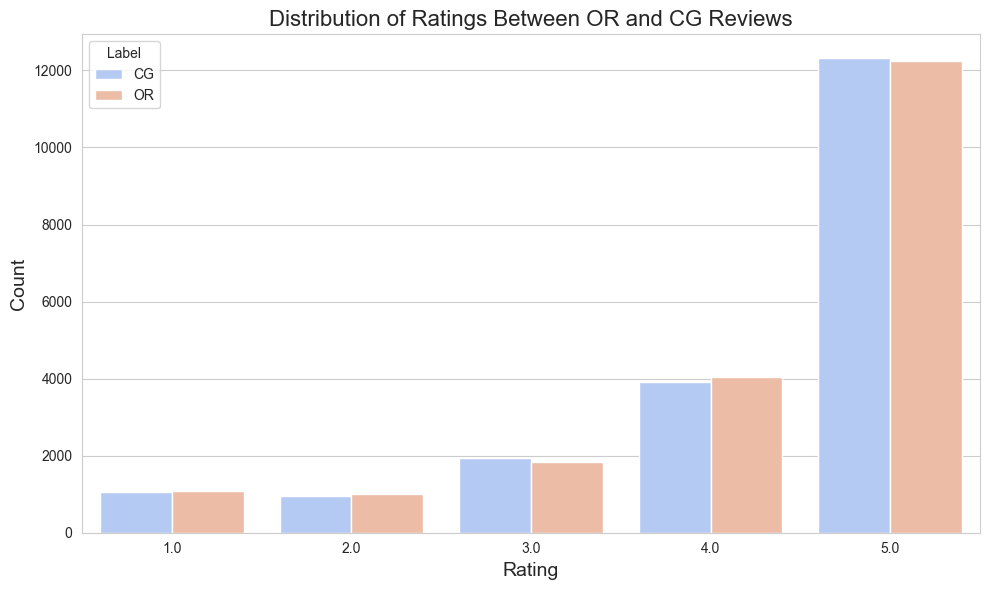

In [21]:
# Set the aesthetic style of the plots
sns.set_style("whitegrid")

# Create a figure and a set of subplots
fig, ax = plt.subplots(figsize=(10, 6))

# Plot the distribution of ratings for both OR and CG reviews
sns.countplot(x='rating', hue='label', data=data, palette='coolwarm', ax=ax)

# Setting the plot title and labels
ax.set_title('Distribution of Ratings Between OR and CG Reviews', fontsize=16)
ax.set_xlabel('Rating', fontsize=14)
ax.set_ylabel('Count', fontsize=14)
ax.legend(title='Label')

# Display the plot
plt.tight_layout()
plt.show()

# Word Cloud (OR vs CG)

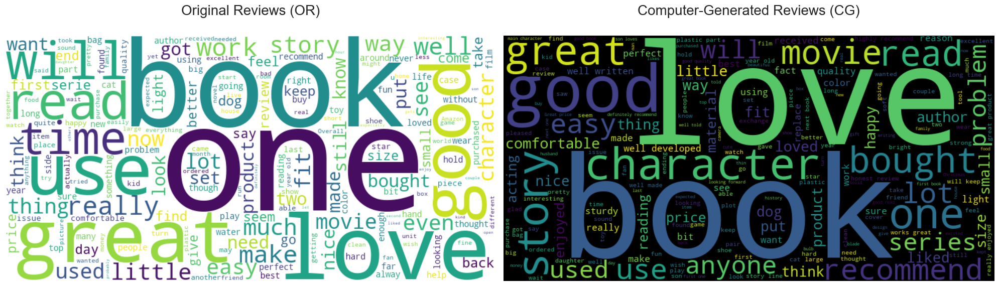

In [39]:
# Separate the reviews based on their label
or_reviews = ' '.join(data[data['label'] == 'OR']['text_'])
cg_reviews = ' '.join(data[data['label'] == 'CG']['text_'])

# Generate word clouds
or_wordcloud = WordCloud(background_color='white', width=800, height=400, max_words=200).generate(or_reviews)
cg_wordcloud = WordCloud(background_color='black', width=800, height=400, max_words=200).generate(cg_reviews)

# Plot the word clouds
fig, axes = plt.subplots(1, 2, figsize=(20, 10))

axes[0].imshow(or_wordcloud, interpolation='bilinear')
axes[0].axis('off')
axes[0].set_title('Original Reviews (OR)', fontsize=20, pad=30)

axes[1].imshow(cg_wordcloud, interpolation='bilinear')
axes[1].axis('off')
axes[1].set_title('Computer-Generated Reviews (CG)', fontsize=20, pad=30)

plt.tight_layout()
plt.show()

# Text Length Analysis

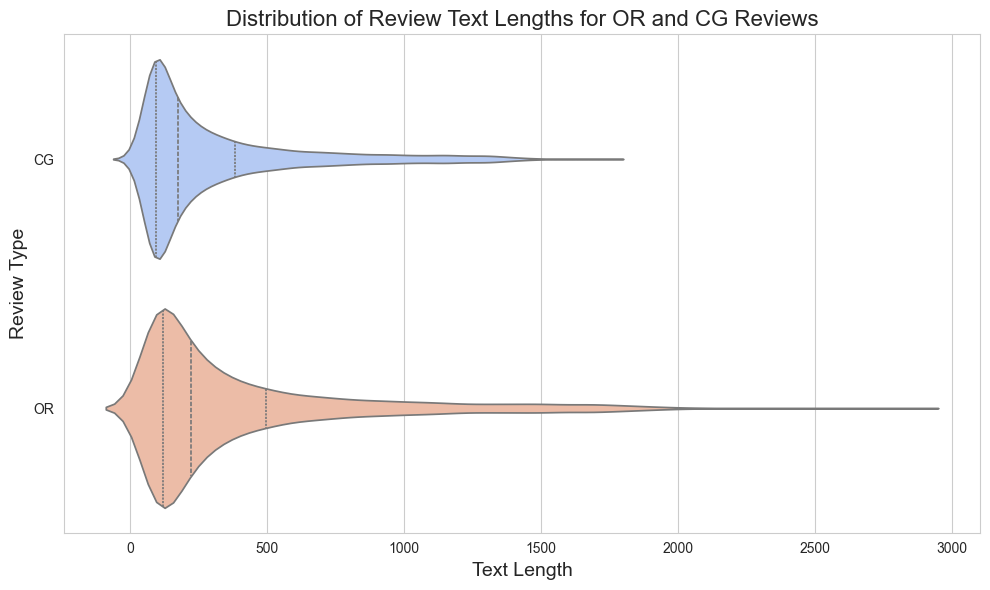

In [27]:
# Create a violin plot to visualize the distribution of review text lengths for OR and CG reviews
plt.figure(figsize=(10, 6))
sns.violinplot(y='label', x='text_length', data=data, palette='coolwarm', inner='quartile', hue='label', dodge=False, legend=False)

# Setting the plot title and labels
plt.title('Distribution of Review Text Lengths for OR and CG Reviews', fontsize=16)
plt.ylabel('Review Type', fontsize=14)  # Adjusted for the flip in x and y axes
plt.xlabel('Text Length', fontsize=14)

plt.tight_layout()
plt.show()

# Sentiment Analysis

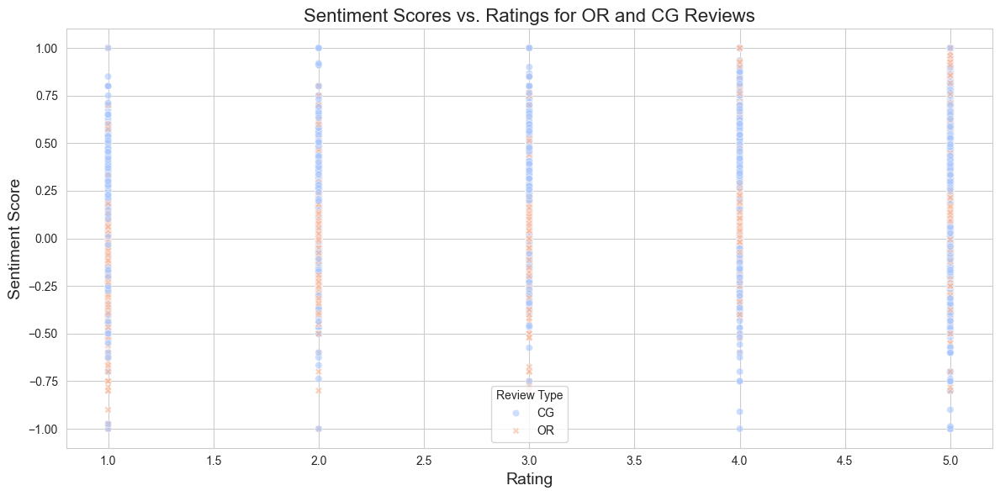

In [29]:
from textblob import TextBlob

# Perform sentiment analysis using TextBlob
data['sentiment'] = data['text_'].apply(lambda x: TextBlob(x).sentiment.polarity)

# Since we want to examine how sentiment correlates with ratings as well, a scatter plot might be more informative.
plt.figure(figsize=(12, 6))

# Plotting sentiment score against ratings for OR and CG reviews
sns.scatterplot(data=data, x='rating', y='sentiment', hue='label', style='label', palette='coolwarm', alpha=0.6)

# Setting the plot title and labels
plt.title('Sentiment Scores vs. Ratings for OR and CG Reviews', fontsize=16)
plt.xlabel('Rating', fontsize=14)
plt.ylabel('Sentiment Score', fontsize=14)
plt.legend(title='Review Type')

plt.tight_layout()
plt.show()


# Word Frequency Analysis

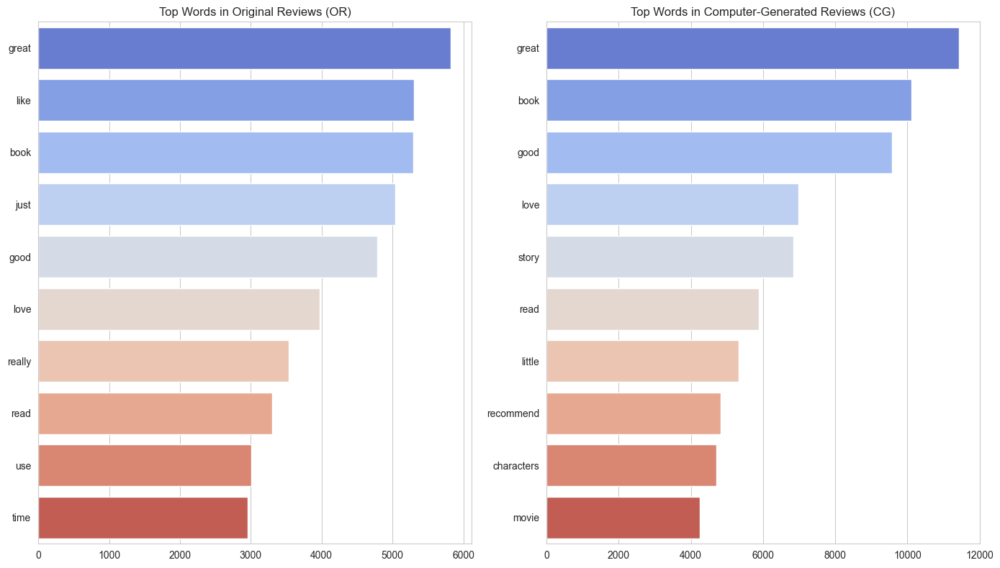

In [34]:
from sklearn.feature_extraction.text import CountVectorizer
import warnings

warnings.simplefilter(action='ignore', category=FutureWarning)

def plot_top_n_words(text, n=10, title="Top Words", ax=None):
    """
    Plot the top n words in the given text.
    """
    # Define a CountVectorizer, excluding common English stopwords
    vect = CountVectorizer(stop_words='english', ngram_range=(1, 1)).fit(text)
    word_counts = vect.transform(text)
    sum_words = word_counts.sum(axis=0)
    
    words_freq = [(word, sum_words[0, idx]) for word, idx in vect.vocabulary_.items()]
    words_freq = sorted(words_freq, key=lambda x: x[1], reverse=True)
    
    # Top n words
    top_words = words_freq[:n]
    words = [word[0] for word in top_words]
    counts = [word[1] for word in top_words]
    
    sns.barplot(x=counts, y=words, palette="coolwarm", ax=ax)
    ax.set_title(title)

# Separate the OR and CG reviews
or_reviews_text = data[data['label'] == 'OR']['text_']
cg_reviews_text = data[data['label'] == 'CG']['text_']

# Create figure for the plots
fig, axes = plt.subplots(1, 2, figsize=(14, 8))

# Plot top words for OR and CG reviews
plot_top_n_words(or_reviews_text, title="Top Words in Original Reviews (OR)", ax=axes[0])
plot_top_n_words(cg_reviews_text, title="Top Words in Computer-Generated Reviews (CG)", ax=axes[1])

plt.tight_layout()
plt.show()


# Rating Distribution by OR and CG 

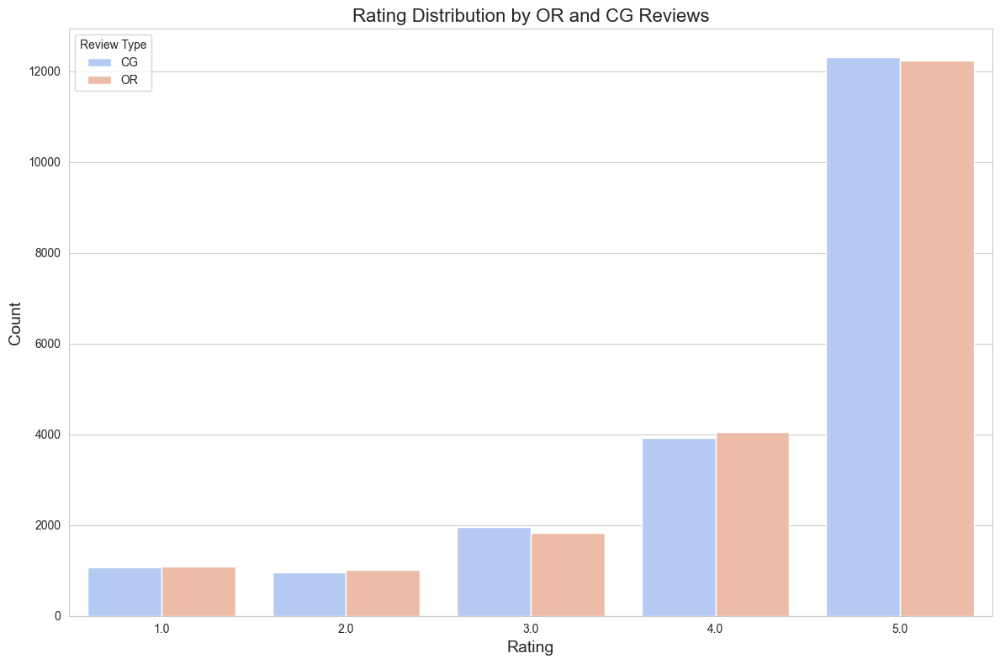

In [36]:
plt.figure(figsize=(12, 8))

# Creating a side-by-side bar chart for the distribution of ratings within OR and CG reviews
sns.countplot(x='rating', hue='label', data=data, palette='coolwarm')

# Setting the plot title and labels
plt.title('Rating Distribution by OR and CG Reviews', fontsize=16)
plt.xlabel('Rating', fontsize=14)
plt.ylabel('Count', fontsize=14)
plt.legend(title='Review Type', loc='upper left')

plt.tight_layout()
plt.show()

# Correlation Analysis of Numerical Features

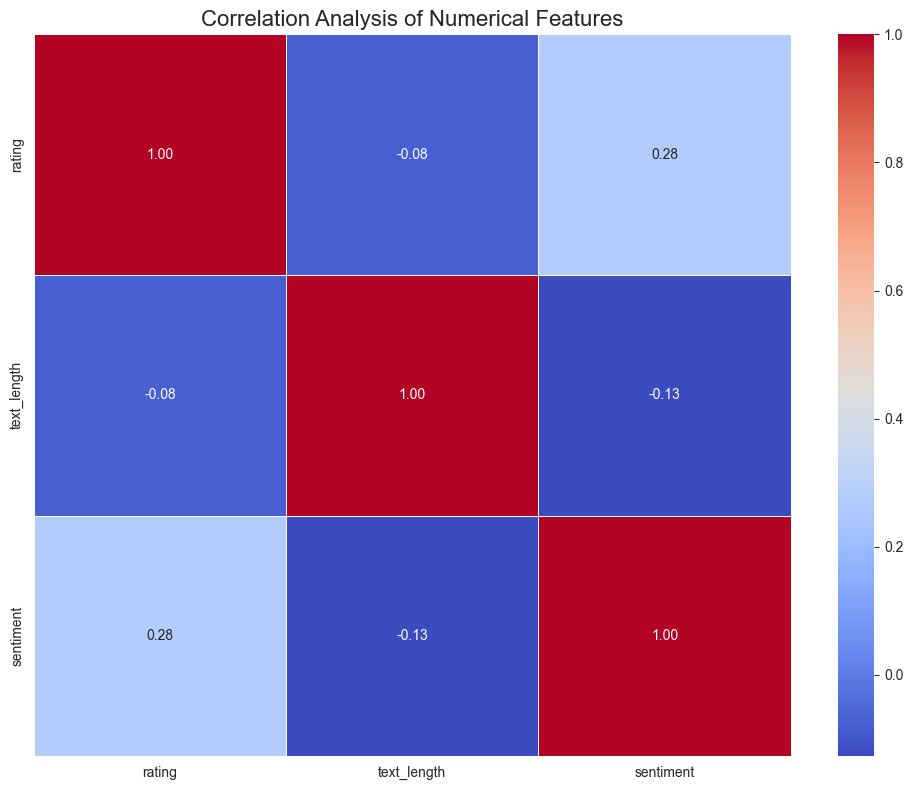

In [37]:
# Selecting numerical features for correlation analysis
features = data[['rating', 'text_length', 'sentiment']]

# Calculating the correlation matrix
corr_matrix = features.corr()

# Plotting the heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5)

# Setting the plot title
plt.title('Correlation Analysis of Numerical Features', fontsize=16)

plt.tight_layout()
plt.show()